In [1]:
%load_ext autoreload
%autoreload 2
%config InlineBackend.figure_format = 'retina'

In [2]:
import scanpy as sc
import plotly.graph_objects as go
import pandas as pd
import scanpy as sc 
import sys 
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import warnings
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.pyplot as plt
import matplotlib as mpl
from collections import defaultdict
from scipy import stats

warnings.filterwarnings('ignore')
sys.path.append('../../src')

from spaceoracle.plotting.cartography import Cartography
from spaceoracle.virtual_tissue import VirtualTissue
from spaceoracle.beta import Betabase

import celloracle as co
%matplotlib inline

/ihome/djishnu/alw399/.local/lib/python3.9/site-packages/louvain/__init__.py:54: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import get_distribution, DistributionNotFound
2025-08-10 17:24:03.163029: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /ihome/crc/install/gcc-12.2.0/postgresql/15.2/lib:/ihome/crc/install/gcc-12.2.0/imagemagick/6.9.12/lib:/ihome/crc/install/gcc-12.2.0/geos/3.9.4/lib:/ihome/crc/install/gcc-12.2.0/zstd/zstd-1.5.5/lib:/ihome/crc/install/gcc-12.2.0/unixodbc/2.3.11/lib:/ihome/crc/install/sodium/1.0.18/lib:/ihome/crc/install/gcc-12.2.0/r/4.4.0/lib64/R/lib:/ihome/crc/install/gcc-12.2

1 package does not meet CellOracle requirement.
 Your jupyter version is not_found. Please install jupyter


In [3]:
adata = sc.read_h5ad('/ix/djishnu/shared/djishnu_kor11/training_data_2025/snrna_human_tonsil.h5ad')
adata.obsm['X_umap'] = pd.read_csv('../../notebooks/human_tonsil/umap.csv', index_col=0).values
adata.obs['x'] = adata.obsm['spatial'][:, 0]
adata.obs['y'] = adata.obsm['spatial'][:, 1]

In [4]:
import json

with open('./colors.json', 'r') as f:
    color_dict = json.load(f)

In [5]:
adata.obs['cell_type_major'] = adata.obs.cell_type_2.replace(
    {
        'GC Dark Zone': 'Germinal Center B cells', 
        'GC Light Zone': 'Germinal Center B cells', 
        'GC Intermediate Zone': 'Germinal Center B cells', 
        'plasma': 'Plasma cells', 
        'B_naive': 'B cells', 
        'B_memory': 'B cells', 
        'B_germinal_center': 'Germinal Center B cells', 
        'Naive CD4 T': 'T cells', 
        'Treg': 'T cells', 
        'T memory': 'T cells', 
        'Th1': 'T cells', 
        'Th2': 'T cells', 
        'T_CD8': 'T cells', 
        'T_follicular_helper': 'T cells', 
        'mDC': 'Dendritic cells', 
        'FDC': 'Dendritic cells', 
        'myeloid': 'Myeloid cells', 
        'NK': 'NK cells', 
        'pDC': 'Dendritic cells', 
        'T_double_neg': 'T cells'
    }
)

In [6]:
from spaceoracle.virtual_tissue import VirtualTissue

savefig_params = {
    'dpi': 300, 
    'bbox_inches': 'tight', 
    'format': 'svg', 
    'transparent': True
}

### Tfh FOXO1 KO

In [7]:
import alphashape
from matplotlib.legend_handler import HandlerTuple
import matplotlib
import seaborn as sns 
from shapely.geometry import Point, MultiPolygon

In [8]:
t_cells = [
    'T_follicular_helper', 
    'T_CD4'
]
adata_ = adata[adata.obs['cell_type'].isin(t_cells)]

In [9]:
adata_ = adata_[adata_.obs['cell_type_2'].isin(
    [
        'T_follicular_helper', 
        # 'T memory',
        'Treg',
        'Th1',
        'Th2',
        'Naive CD4 T'
    ]
)]

# to avoid issues with concat in virtual tissue
adata_.obs = adata_.obs.drop(['x', 'y'], axis=1)

In [10]:
adata_.obs['cell_type_2'].value_counts()

cell_type_2
T_follicular_helper    291
Treg                   198
Naive CD4 T            177
Th1                     88
Th2                     47
Name: count, dtype: int64

In [11]:
simulated_df = pd.read_parquet(f'/ix/djishnu/shared/djishnu_kor11/genome_screens/human_tonsil/FOXO1_4n_0x_CD4_Tfh.parquet')
adata.layers['simulated_count'] = simulated_df.loc[adata.obs.index, adata.var_names]

simulated_df = simulated_df.loc[adata_.obs.index]
perturbed_df = simulated_df
simulated_df['FOXO1'].sum()

0.0

In [12]:
tonsil = VirtualTissue(
    adata = adata_,
    annot = 'cell_type_2',
    color_dict=color_dict
)

tonsil.init_cartography(adata_)

In [13]:
adata_.n_obs * 0.2

160.20000000000002

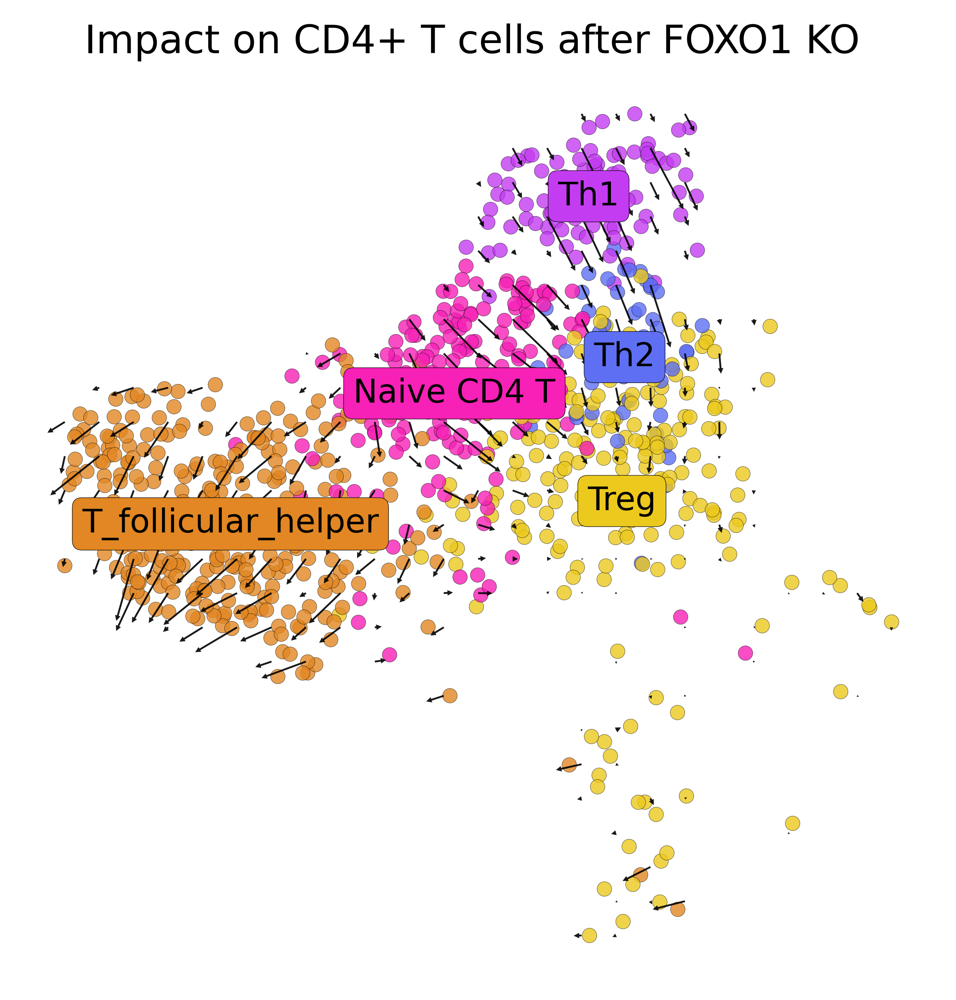

In [14]:
tonsil.plot_arrows(
    perturb_target='FOXO1', 
    mode='0',
    perturbed_df=perturbed_df,
    hue='cell_type_2',
    curve=True,
    vector_scale=0.5, 
    grid_scale=1.0,
    n_neighbors=160,
    scale=7,
    grains=25,
    limit_clusters=True,
    scatter_size=20,
    legend_fontsize=10,
    # highlight_clusters=[
    #     'regular_mac',
    #     'hyper_mac'
    # ],
    grey_out=False
)

plt.title('Impact on CD4+ T cells after FOXO1 KO ')
plt.savefig(
    './figures/FOXO1_KO_quiver_CD4_Tfh.svg', 
    **savefig_params
)
plt.show()

In [15]:
delta_X = simulated_df - adata_.to_df(layer='imputed_count')
delta_dict = defaultdict(dict)

In [16]:
min_val = 1e-7

for ct in adata_.obs['cell_type_2'].unique():
    for gene in ['KLF2', 'SELL', 'FOXP3', 'CTLA4', 'BCL6', 'PDCD1', 'CCR4', 'IL7R', 'IKZF2',
                'ICOS', 'CXCR5', 'CD40LG', 'IL2RA','HLA-DRA', 'HLA-DRB5', 'HLA-DRB1', 'PTPRC',
                'TGFB1', 'TGFB2', 'TGFB3', 'TBX21', 'IFNG', 'CCR5', 'CXCR3']:
        cells = adata_.obs[adata_.obs.cell_type_2 == ct].index

        imputed_counts = adata_.to_df(layer='imputed_count').loc[cells, gene]
        simulated_counts = delta_X.loc[cells, gene] + imputed_counts

        # delta_dict[ct][gene] = 100 * (simulated_counts - imputed_counts) / (imputed_counts + min_val)
        delta_dict[ct][gene] = np.log2((simulated_counts + min_val) / (imputed_counts + min_val))

        # # log safe division
        # imputed_counts_safe = np.where(imputed_counts == 0, min_val, imputed_counts)
        # simulated_counts_safe = np.where(simulated_counts == 0, min_val, simulated_counts)
        # delta_dict[ct][gene] = np.log2((simulated_counts_safe) / (imputed_counts_safe))


In [17]:
delta_dict.keys()

dict_keys(['Th1', 'T_follicular_helper', 'Naive CD4 T', 'Treg', 'Th2'])

In [18]:
delta_dict['Progenitor Treg'] = delta_dict['Treg'] # rename

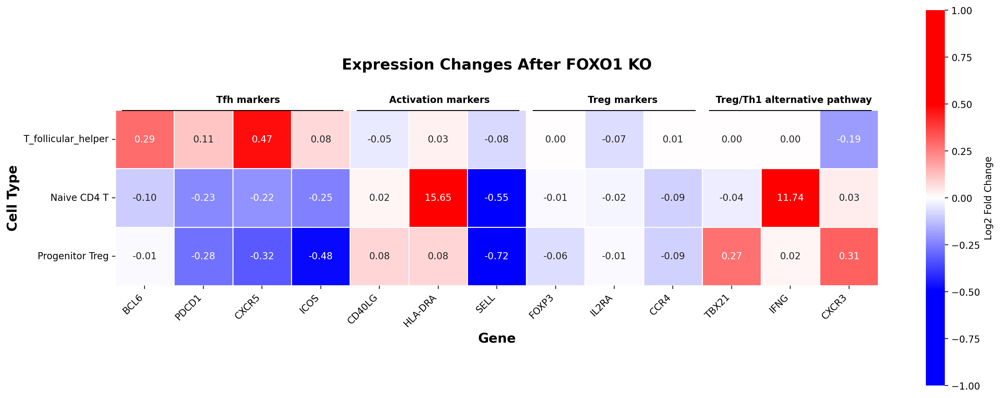

In [19]:
# Define cell types and genes for each
cell_types = [
    'T_follicular_helper', 'Naive CD4 T', 
    'Progenitor Treg', 
    # 'Th1',
    # 'Th2', 'T memory'
]
all_genes = [
    'BCL6', 'PDCD1', 'CXCR5', 'ICOS', # Tfh markers
    'CD40LG', 'HLA-DRA', 'SELL', # Naive CD4 activation markers
    'FOXP3', 'IL2RA', 'CCR4',  # Treg function markers
    'TBX21', 'IFNG', 'CXCR3' # Th1 markers 
    # Naive FOXO1-deficient CD4+ T cells that are activated with antibodies 
    # specific for CD3 and CD28 in the presence of TGFβ do not differentiate into FOXP3+ TReg cells, 
    # as would be expected for wild-type T cells, but instead become T-bet+IFNγ+ TH1 cells. 
]

# Prepare heatmap data
heatmap_data = []
for ct in cell_types:
    row = []
    for gene in all_genes:
        if ct in delta_dict and gene in delta_dict[ct]:
            # Calculate mean log2 fold change for this cell type and gene
            # mean_change = np.mean(delta_dict[ct][gene])
            mean_change = np.mean(delta_dict[ct][gene])
            row.append(mean_change)
        else:
            row.append(0)
    heatmap_data.append(row)

heatmap_df = pd.DataFrame(heatmap_data, index=cell_types, columns=all_genes)

# Create the heatmap
fig, ax = plt.subplots(figsize=(16, 6))

# Create custom colormap: blue for negative, white for zero, red for positive
colors = ['blue', 'blue', 'white', 'red', 'red']
n_bins = 1000
cmap = LinearSegmentedColormap.from_list('custom_diverging', colors, N=n_bins)

max_abs_val = 1

sns.heatmap(
    heatmap_df,
    annot=True,
    fmt='.2f',
    cmap=cmap,
    center=0,
    vmin=-max_abs_val,
    vmax=max_abs_val,
    linewidths=0.5,
    linecolor='white',
    cbar_kws={'label': 'Log2 Fold Change'},
    ax=ax,
    square=True
)

ax.set_title('Expression Changes After FOXO1 KO', fontsize=16, fontweight='bold', y=1.2)
ax.set_xlabel('Gene', fontsize=14, fontweight='bold')
ax.set_ylabel('Cell Type', fontsize=14, fontweight='bold')
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)

# Add lines under gene groups
# Tfh markers (BCL6, PDCD1, CXCR5, ICOS) - positions 0-3
fig_width = fig.get_figwidth()
line_clip = 0.01
text_clip = 0.25
ax.axhline(y=0, xmin=line_clip, xmax=4/len(all_genes) - line_clip, color='black', linewidth=2)
ax.text(fig_width * 2/len(all_genes) - 0.2, -text_clip, 'Tfh markers', ha='center', va='top', fontsize=10, fontweight='bold')

# Naive CD4 activation markers (CD40LG, HLA-DRA, HLA-DRB1) - positions 5-7
ax.axhline(y=0, xmin=4/len(all_genes) + line_clip, xmax=7/len(all_genes) - line_clip, color='black', linewidth=2)
ax.text(fig_width * 4/len(all_genes) + 0.6, -text_clip, 'Activation markers', ha='center', va='top', fontsize=10, fontweight='bold')

# Treg pathway
ax.axhline(y=0, xmin=7/len(all_genes) + line_clip, xmax=10/len(all_genes) - line_clip, color='black', linewidth=2)
ax.text(fig_width * 7/len(all_genes) + 0.03, -text_clip, 'Treg markers', ha='center', va='top', fontsize=10, fontweight='bold')

# Th1 markers
ax.axhline(y=0, xmin=10/len(all_genes) + line_clip, xmax=1 - line_clip, color='black', linewidth=2)
ax.text(fig_width * 10/len(all_genes) - 0.75, -text_clip, 'Treg/Th1 alternative pathway', ha='center', va='top', fontsize=10, fontweight='bold')


plt.tight_layout()
plt.savefig(f'figures/FOXO1_KO_expression_changes_CD4_Tfh.svg', format='svg', bbox_inches='tight', transparent=True)
plt.show()

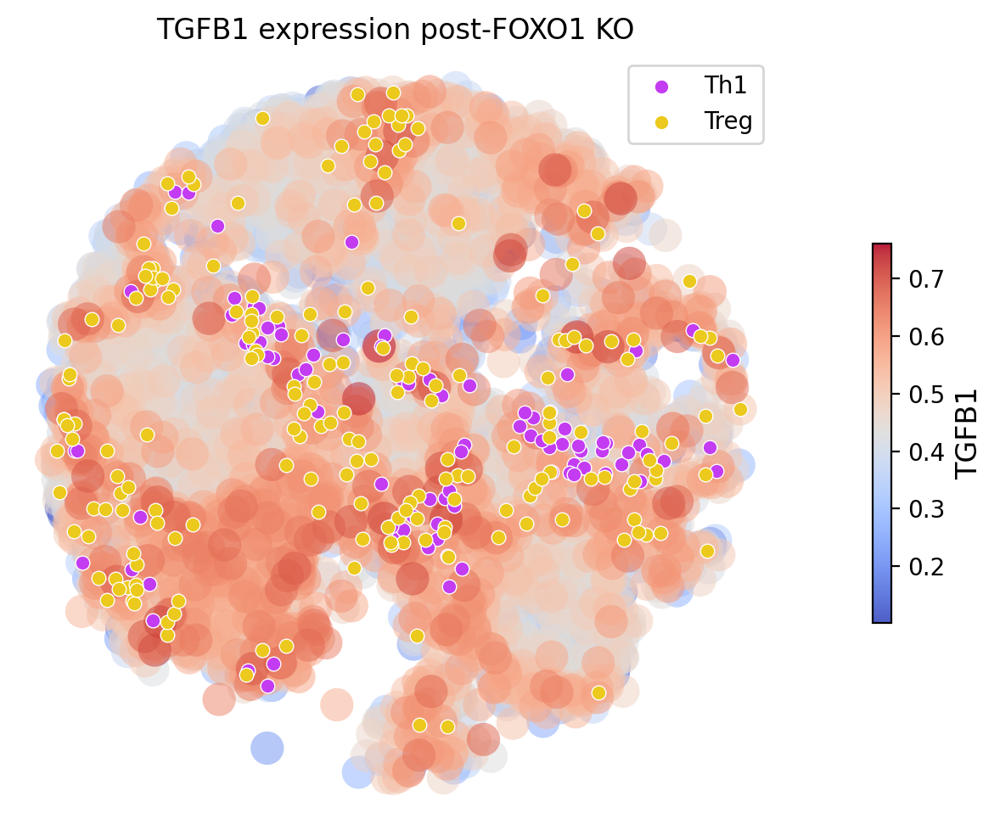

In [20]:
data = pd.concat([adata.obs, adata.to_df('simulated_count')['TGFB1']], axis=1)

fig, ax = plt.subplots(figsize=(15, 5))
sc = ax.scatter(
    data.sort_values('TGFB1', ascending=True)['x'],
    data.sort_values('TGFB1', ascending=True)['y'],
    c=data.sort_values('TGFB1', ascending=True)['TGFB1'],
    cmap='coolwarm',
    s=200,
    alpha=0.5,
    edgecolors='none'
)
sns.scatterplot(data=data[data.cell_type_2 == 'Th1'], x='x', y='y', color=color_dict['Th1'], ax=ax, legend=True, label='Th1')
sns.scatterplot(data=data[data.cell_type_2 == 'Treg'], x='x', y='y', color=color_dict['Treg'], ax=ax, legend=True, label='Treg')

cbar = plt.colorbar(sc, ax=ax, fraction=0.03, pad=0.04, shrink=0.5)
cbar.solids.set_alpha(0.9)
cbar.set_label('TGFB1', fontsize=12)
ax.set_aspect('equal')
ax.set_axis_off()

plt.title('TGFB1 expression post-FOXO1 KO')
plt.tight_layout()
plt.savefig('figures/TGFB1_expression_post_FOXO1KO.svg', format='svg', bbox_inches='tight', transparent=True)
plt.show()

In [21]:
adata.obs.head(3)

,cell_type,author_cell_type,cell_type_int,banksy_celltypes,cell_type_2,x,y,cell_type_major
NAME,,,,,,,,
AAACCCAAGCGCCTTG-1,T_CD4,T_CD4,5,T_CD4,Th1,1316.740257,1264.948201,T cells
AAACCCAAGTGGACGT-1,plasma,plasma,12,plasma,plasma,394.576801,1686.759590,Plasma cells
AAACCCACAGAAGTGC-1,B_germinal_center,B_germinal_center,0,GC Light Zone,GC Light Zone,808.557275,1639.657830,Germinal Center B cells


In [22]:
adata_ = adata[adata.obs['cell_type'].isin(t_cells)]
adata_

View of AnnData object with n_obs × n_vars = 1073 × 3333
    obs: 'cell_type', 'author_cell_type', 'cell_type_int', 'banksy_celltypes', 'cell_type_2', 'x', 'y', 'cell_type_major'
    uns: 'cell_thresholds', 'cell_type_int_colors', 'received_ligands', 'received_ligands_tfl'
    obsm: 'spatial', 'spatial_unscaled', 'X_umap'
    layers: 'imputed_count', 'normalized_count', 'simulated_count'

In [23]:
chart = Cartography(adata_, color_dict)

In [24]:
delta_X = (simulated_df - chart.unperturbed_expression).values
gene_mtx = chart.unperturbed_expression.values

embedding = adata_.obsm['X_umap']
P = chart.compute_transition_probabilities(delta_X, embedding, n_neighbors=800)

In [25]:
# del chart.adata.obs['transition']

In [26]:
chart.get_transition_annot(
    P, 
    allowed_fates=chart.adata.obs['cell_type'].unique(), 
    thresh=0, 
    annot='cell_type'
)

source ct T_CD4 Counter({'T_CD4': 664, 'T_follicular_helper': 115}) 0.0 0.0
source ct T_follicular_helper Counter({'T_follicular_helper': 294}) 0.0007139604525788956 0.0


In [27]:
ct_points_wt, ct_points_ko = chart.make_celltype_dict(annot='cell_type')

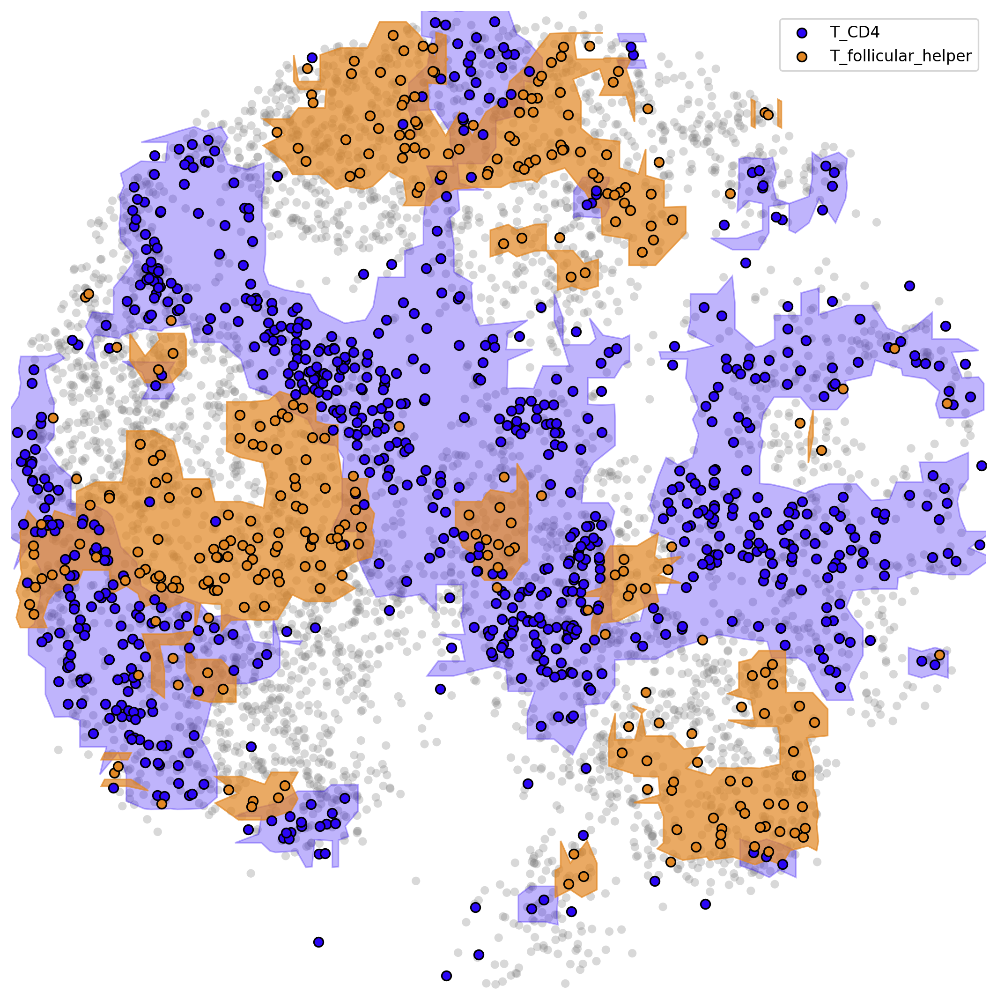

In [28]:
alpha_shapes = {}

for cluster, points in ct_points_wt.items():
    alpha_shapes[cluster] = alphashape.alphashape(points, alpha=0.03)

fig, ax = plt.subplots(figsize=(20, 9), dpi=120)

scatter = sns.scatterplot(
    data = adata.obs,
    x='x', y='y',
    color='grey',
    s=30,
    alpha=0.3,
    edgecolor='none',
    ax=ax,
)

zone_alpha = 0.7
area_thresh = 0

for cluster in adata_.obs['cell_type'].unique():
    alpha_shape = alpha_shapes.get(cluster)

    if cluster == 'T_CD4':
        zone_alpha = 0.3
    else:
        zone_alpha = 0.7
    
    if alpha_shape is None:
        continue

    if isinstance(alpha_shape, MultiPolygon):
        for geom in alpha_shape.geoms:
            if geom.area > area_thresh:
                ax.fill(
                    geom.exterior.xy[0], 
                    geom.exterior.xy[1], 
                    color=color_dict[str(cluster)], alpha=zone_alpha)
    else:
        geom = alpha_shape
        ax.fill(
            geom.exterior.xy[0], 
            geom.exterior.xy[1], 
            color=color_dict[str(cluster)], alpha=zone_alpha
        )

for ct in chart.adata.obs['cell_type'].unique():
    ax.scatter(
        chart.adata[chart.adata.obs['cell_type'] == ct].obsm['spatial'][:, 0],
        chart.adata[chart.adata.obs['cell_type'] == ct].obsm['spatial'][:, 1],
        c=color_dict[ct], alpha=1, edgecolor='black', linewidth=1,
        label=ct
    )

handles, labels = ax.get_legend_handles_labels()
ax.legend(handles, labels)

ax.set_frame_on(False)
ax.set_xticks([])
ax.set_yticks([])
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_aspect('equal')
ax.set_xlim(adata.obs.x.min() - 10, adata.obs.x.max() + 10)
ax.set_ylim(adata.obs.y.min() - 10, adata.obs.y.max() + 10)
plt.tight_layout()

plt.savefig(f'figures/FOXO1_KO_preKO_ST_Cd4.svg', format='svg', bbox_inches='tight', transparent=True)

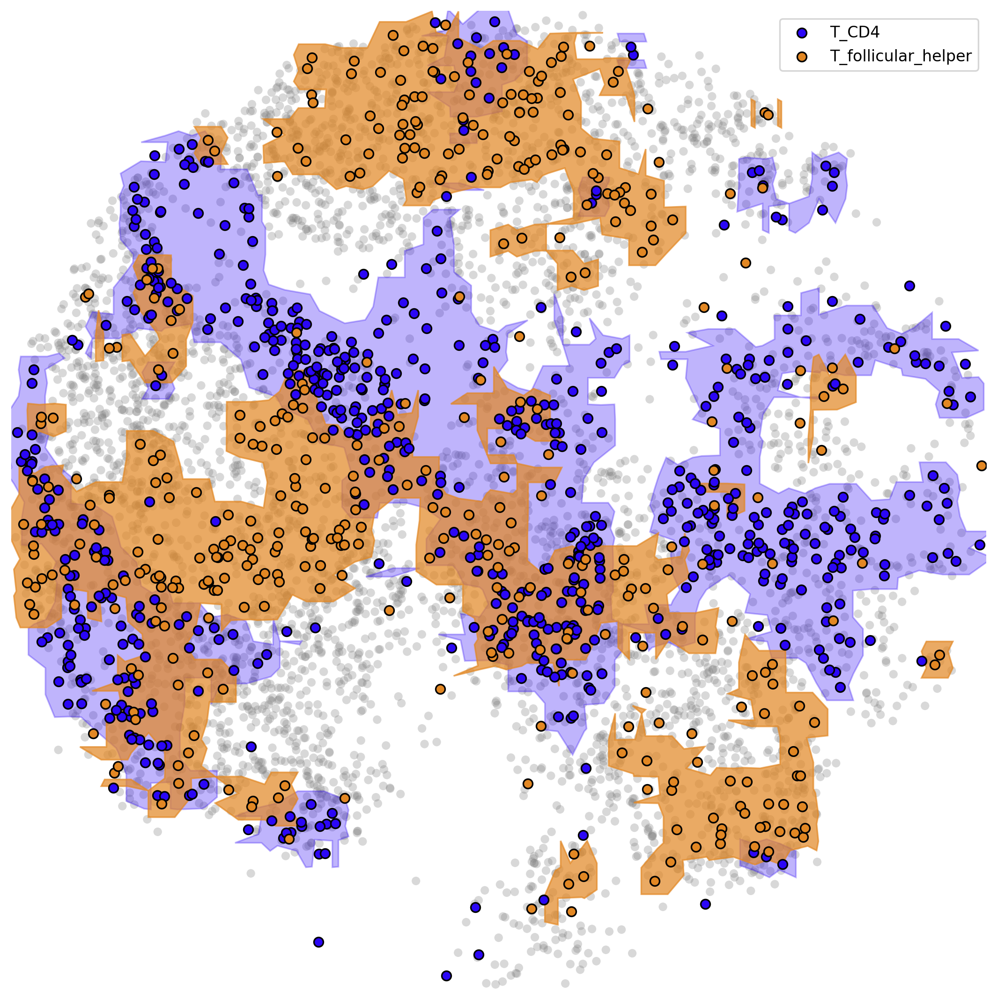

In [29]:
alpha_shapes = {}

for cluster, points in ct_points_ko.items():
    alpha_shapes[cluster] = alphashape.alphashape(points, alpha=0.03)

fig, ax = plt.subplots(figsize=(20, 9), dpi=120)

scatter = sns.scatterplot(
    data = adata.obs,
    x='x', y='y',
    color='grey',
    s=30,
    alpha=0.3,
    edgecolor='none',
    ax=ax,
)

zone_alpha = 0.7
area_thresh = 0

for cluster in adata_.obs['cell_type'].unique():
    alpha_shape = alpha_shapes.get(cluster)
    
    if alpha_shape is None:
        continue

    if cluster == 'T_CD4':
        zone_alpha = 0.3
    else:
        zone_alpha = 0.7

    if isinstance(alpha_shape, MultiPolygon):
        for geom in alpha_shape.geoms:
            if geom.area > area_thresh:
                ax.fill(
                    geom.exterior.xy[0], 
                    geom.exterior.xy[1], 
                    color=color_dict[str(cluster)], alpha=zone_alpha)
    else:
        geom = alpha_shape
        ax.fill(
            geom.exterior.xy[0], 
            geom.exterior.xy[1], 
            color=color_dict[str(cluster)], alpha=zone_alpha
        )

for ct in chart.adata.obs['transition'].unique():
    ax.scatter(
        chart.adata[chart.adata.obs['transition'] == ct].obsm['spatial'][:, 0],
        chart.adata[chart.adata.obs['transition'] == ct].obsm['spatial'][:, 1],
        c=color_dict[ct], alpha=1, edgecolor='black', linewidth=1,
        label=ct
    )

handles, labels = ax.get_legend_handles_labels()
ax.legend(handles, labels)

ax.set_frame_on(False)
ax.set_xticks([])
ax.set_yticks([])
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_aspect('equal')
ax.set_xlim(adata.obs.x.min() - 10, adata.obs.x.max() + 10)
ax.set_ylim(adata.obs.y.min() - 10, adata.obs.y.max() + 10)
plt.tight_layout()

plt.savefig(f'figures/FOXO1_KO_postKO_ST_Cd4.svg', format='svg', bbox_inches='tight', transparent=True)

In [30]:
import plotly.graph_objects as go
import numba
numba.set_num_threads(1)

In [31]:
# def plot_sankey_from_counts(df, counts, title, savepath, color_dict=None):
#     all_labels = sorted(set(counts.index) | set(counts.columns))
#     counts = counts.reindex(index=all_labels, columns=all_labels, fill_value=0)

#     sources = []
#     targets = []
#     values = []
#     link_colors = []
#     label_to_idx = {label: i for i, label in enumerate(all_labels)}

#     # Assign node colors using color_dict if provided, else default to blue
#     if color_dict is not None:
#         node_colors = [color_dict.get(label, "#1f77b4") for label in all_labels]
#     else:
#         node_colors = "blue"

#     for src in all_labels:
#         for tgt in all_labels:
#             val = counts.loc[src, tgt]
#             if val > 0:
#                 sources.append(label_to_idx[src])
#                 targets.append(label_to_idx[tgt])
#                 values.append(val)
#                 # Use color_dict for link color if available, else default rgba
#                 if color_dict is not None:
#                     # Use source color for the link, with alpha
#                     base_color = color_dict.get(src, "#1f77b4")
#                     # Convert hex to rgba with alpha=0.4
#                     if base_color.startswith("#") and len(base_color) == 7:
#                         r = int(base_color[1:3], 16)
#                         g = int(base_color[3:5], 16)
#                         b = int(base_color[5:7], 16)
#                         link_colors.append(f"rgba({r},{g},{b},0.4)")
#                     else:
#                         link_colors.append("rgba(31,119,180,0.4)")
#                 else:
#                     link_colors.append("rgba(31,119,180,0.4)")

#     fig = go.Figure(data=[go.Sankey(
#         node=dict(
#             pad=15,
#             thickness=20,
#             line=dict(color="black", width=0.5),
#             label=all_labels,
#             color=node_colors
#         ),
#         link=dict(
#             source=sources,
#             target=targets,
#             value=values,
#             color=link_colors
#         )
#     )])

#     fig.update_layout(
#         title_text=title,
#         font_size=10,
#         autosize=False,
#         width=500,
#         height=400,
#         margin=dict(l=10, r=10, t=40, b=10)
#     )

#     fig.write_image(savepath, format=savepath.split('.')[-1], engine='orca')
#     fig.show()


In [32]:
def plot_sankey_from_counts(df, counts, title, savepath, color_dict=None):
    counts = counts.sort_index(axis=0).sort_index(axis=1)

    left_labels = sorted(list(counts.index))
    right_labels = sorted(list(counts.columns))

    # Create unique node keys for left and right, but display the same label
    left_keys = [f"{label}__from" for label in left_labels]
    right_keys = [f"{label}__to" for label in right_labels]
    all_keys = left_keys + right_keys

    all_labels = left_labels + right_labels

    # Map from original label to unique key
    left_label_to_key = {label: f"{label}__from" for label in left_labels}
    right_label_to_key = {label: f"{label}__to" for label in right_labels}

    # Map unique keys to node indices
    left_key_to_idx = {key: i for i, key in enumerate(left_keys)}
    right_key_to_idx = {key: i + len(left_keys) for i, key in enumerate(right_keys)}
    key_to_idx = {**left_key_to_idx, **right_key_to_idx}

    # Node colors
    if color_dict is not None:
        node_colors = [color_dict.get(label, "#1f77b4") for label in all_labels]
    else:
        node_colors = "blue"

    sources = []
    targets = []
    values = []
    link_colors = []

    for src in left_labels:
        for tgt in right_labels:
            val = counts.loc[src, tgt] if (src in counts.index and tgt in counts.columns) else 0
            if val > 0:
                src_key = left_label_to_key[src]
                tgt_key = right_label_to_key[tgt]
                sources.append(key_to_idx[src_key])
                targets.append(key_to_idx[tgt_key])
                values.append(val)
                # Use color_dict for link color if available, else default rgba
                if color_dict is not None:
                    base_color = color_dict.get(src, "#1f77b4")
                    if base_color.startswith("#") and len(base_color) == 7:
                        r = int(base_color[1:3], 16)
                        g = int(base_color[3:5], 16)
                        b = int(base_color[5:7], 16)
                        link_colors.append(f"rgba({r},{g},{b},0.4)")
                    else:
                        link_colors.append("rgba(31,119,180,0.4)")
                else:
                    link_colors.append("rgba(31,119,180,0.4)")

    # Set node x positions: left column at 0, right column at 1
    node_x = [0.0] * len(left_keys) + [1.0] * len(right_keys)

    fig = go.Figure(data=[go.Sankey(
        # arrangement="snap",
        node=dict(
            pad=15,
            thickness=20,
            line=dict(color="black", width=0.5),
            label=all_labels,
            color=node_colors,
            x=node_x,
        ),
        link=dict(
            source=sources,
            target=targets,
            value=values,
            color=link_colors
        )
    )])

    fig.update_layout(
        title_text=title,
        font_size=10,
        autosize=False,
        width=500,
        height=400,
        margin=dict(l=10, r=10, t=40, b=10)
    )

    fig.write_image(savepath, format=savepath.split('.')[-1], engine='orca')
    fig.show()

In [33]:

df = chart.adata.obs[['cell_type', 'transition']].copy()
counts = df.groupby(['cell_type', 'transition']).size().unstack(fill_value=0)

plot_sankey_from_counts(
    df, counts, 
    "SpaceTravLR transitions from FOXO1 KO", 
    "figures/FOXO1_KO_transitions_Cd4_sankey.svg", 
    color_dict=color_dict
)

Retrying in 8.20 seconds due to HTTPConnectionPool(host='localhost', port=42025): Max retries exceeded with url: / (Caused by NewConnectionError('<urllib3.connection.HTTPConnection object at 0x7fa78a5c5a90>: Failed to establish a new connection: [Errno 111] Connection refused'))...


### FOXO1 GC B cells

In [34]:
oracle = co.load_hdf5('/ix/djishnu/shared/djishnu_kor11/co_objects/tonsil.celloracle.oracle')

In [35]:
links = co.load_hdf5("/ix/djishnu/shared/djishnu_kor11/co_objects/tonsil.celloracle.links")

In [36]:
links.filter_links()
oracle.get_cluster_specific_TFdict_from_Links(links_object=links)
oracle.fit_GRN_for_simulation(alpha=10, use_cluster_specific_TFdict=True)

  0%|          | 0/9 [00:00<?, ?it/s]

In [37]:
goi = 'FOXO1'
oracle.simulate_shift(perturb_condition={goi: 0.0},
                      n_propagation=3)

In [38]:
# Get transition probability
oracle.estimate_transition_prob(n_neighbors=200, knn_random=True, sampled_fraction=1)

# Calculate embedding
oracle.calculate_embedding_shift(sigma_corr = 0.05)

In [39]:
adata_ = adata[adata.obs['banksy_celltypes'].isin(
    ['GC Intermediate Zone','GC Dark Zone','GC Light Zone']
)]

chart = Cartography(adata_, color_dict)

In [40]:
# CellOracle
simulated_df = oracle.adata.to_df(layer='simulated_count').loc[adata_.obs.index]
method='CO'

In [41]:
co_P = pd.DataFrame(oracle.corrcoef, index=oracle.adata.obs.index, columns=oracle.adata.obs.index)
P = co_P.loc[adata_.obs.index, adata_.obs.index].values

In [42]:
chart.get_transition_annot(
    P, 
    allowed_fates=chart.adata.obs['banksy_celltypes'].unique(), 
    thresh=0, 
    annot='banksy_celltypes'
)

source ct GC Light Zone Counter({'GC Light Zone': 436, 'GC Intermediate Zone': 240, 'GC Dark Zone': 50}) 0.0006462158647597368 0.0
source ct GC Intermediate Zone Counter({'GC Light Zone': 225, 'GC Intermediate Zone': 169, 'GC Dark Zone': 63}) 0.000705315850997693 0.0
source ct GC Dark Zone Counter({'GC Dark Zone': 216, 'GC Light Zone': 209, 'GC Intermediate Zone': 135}) 0.0009352392756129733 0.0


In [43]:
ct_points_wt, ct_points_ko = chart.make_celltype_dict(annot='banksy_celltypes')

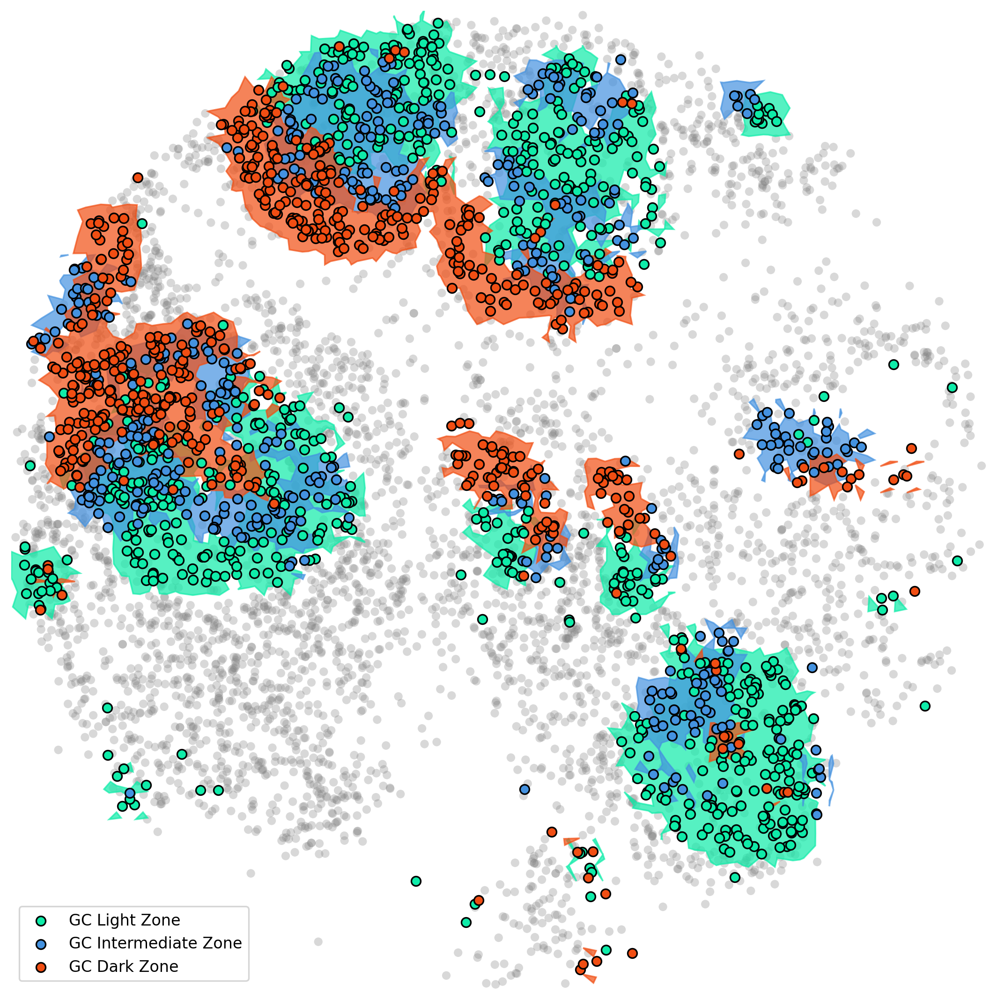

In [44]:
alpha_shapes = {}

for cluster, points in ct_points_wt.items():
    alpha_shapes[cluster] = alphashape.alphashape(points, alpha=0.05)

fig, ax = plt.subplots(figsize=(20, 9), dpi=120)

scatter = sns.scatterplot(
    data = adata.obs,
    x='x', y='y',
    color='grey',
    s=30,
    alpha=0.3,
    edgecolor='none',
    ax=ax,
)

zone_alpha = 0.7
area_thresh = 0

for cluster in ['GC Light Zone', 'GC Intermediate Zone', 'GC Dark Zone']:
    alpha_shape = alpha_shapes.get(cluster)
    
    if alpha_shape is None:
        continue

    if isinstance(alpha_shape, MultiPolygon):
        for geom in alpha_shape.geoms:
            if geom.area > area_thresh:
                ax.fill(
                    geom.exterior.xy[0], 
                    geom.exterior.xy[1], 
                    color=color_dict[str(cluster)], alpha=zone_alpha)
    else:
        geom = alpha_shape
        ax.fill(
            geom.exterior.xy[0], 
            geom.exterior.xy[1], 
            color=color_dict[str(cluster)], alpha=zone_alpha
        )

for ct in chart.adata.obs['banksy_celltypes'].unique():
    ax.scatter(
        chart.adata[chart.adata.obs['banksy_celltypes'] == ct].obsm['spatial'][:, 0],
        chart.adata[chart.adata.obs['banksy_celltypes'] == ct].obsm['spatial'][:, 1],
        c=color_dict[ct], alpha=1, edgecolor='black', linewidth=1,
        label=ct
    )

handles, labels = ax.get_legend_handles_labels()
ax.legend(handles, labels)

ax.set_frame_on(False)
ax.set_xticks([])
ax.set_yticks([])
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_aspect('equal')
ax.set_xlim(adata.obs.x.min() - 10, adata.obs.x.max() + 10)
ax.set_ylim(adata.obs.y.min() - 10, adata.obs.y.max() + 10)
plt.tight_layout()

plt.savefig(f'figures/{goi}KO_preKO_{method}.svg', format='svg', bbox_inches='tight', transparent=True)

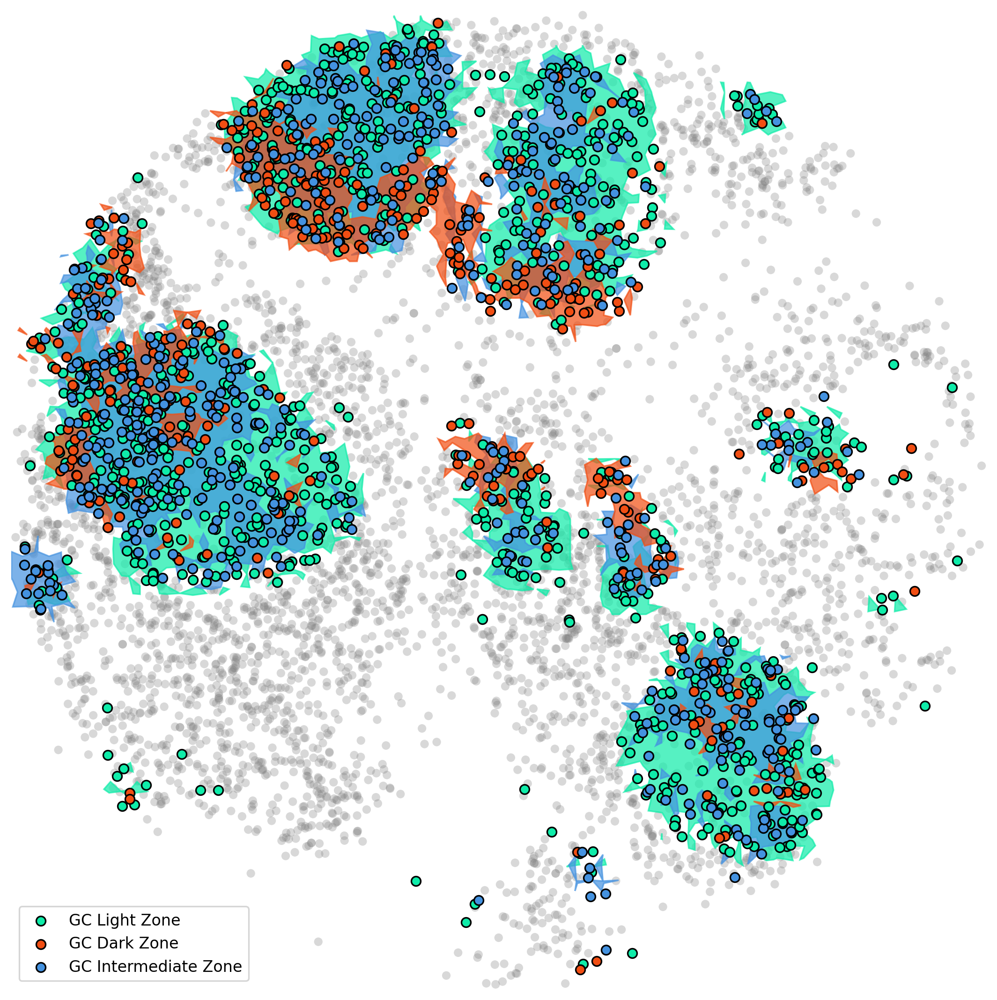

In [45]:
alpha_shapes = {}

for cluster, points in ct_points_ko.items():
    alpha_shapes[cluster] = alphashape.alphashape(points, alpha=0.05)

fig, ax = plt.subplots(figsize=(20, 9), dpi=120)

scatter = sns.scatterplot(
    data = adata.obs,
    x='x', y='y',
    color='grey',
    s=30,
    alpha=0.3,
    edgecolor='none',
    ax=ax,
)

zone_alpha = 0.7
area_thresh = 0

for cluster in ['GC Light Zone', 'GC Intermediate Zone', 'GC Dark Zone']:
    alpha_shape = alpha_shapes.get(cluster)
    
    if alpha_shape is None:
        continue

    if isinstance(alpha_shape, MultiPolygon):
        for geom in alpha_shape.geoms:
            if geom.area > area_thresh:
                ax.fill(
                    geom.exterior.xy[0], 
                    geom.exterior.xy[1], 
                    color=color_dict[str(cluster)], alpha=zone_alpha)
    else:
        geom = alpha_shape
        ax.fill(
            geom.exterior.xy[0], 
            geom.exterior.xy[1], 
            color=color_dict[str(cluster)], alpha=zone_alpha
        )

for ct in chart.adata.obs['transition'].unique():
    ax.scatter(
        chart.adata[chart.adata.obs['transition'] == ct].obsm['spatial'][:, 0],
        chart.adata[chart.adata.obs['transition'] == ct].obsm['spatial'][:, 1],
        c=color_dict[ct], alpha=1, edgecolor='black', linewidth=1,
        label=ct
    )

handles, labels = ax.get_legend_handles_labels()
ax.legend(handles, labels)

ax.set_frame_on(False)
ax.set_xticks([])
ax.set_yticks([])
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_aspect('equal')
ax.set_xlim(adata.obs.x.min() - 10, adata.obs.x.max() + 10)
ax.set_ylim(adata.obs.y.min() - 10, adata.obs.y.max() + 10)
plt.tight_layout()

plt.savefig(f'figures/{goi}KO_postKO_{method}.svg', format='svg', bbox_inches='tight', transparent=True)

In [46]:
df = chart.adata.obs[['banksy_celltypes', 'transition']].copy()
counts = df.groupby(['banksy_celltypes', 'transition']).size().unstack(fill_value=0)

plot_sankey_from_counts(
    df, counts, 
    "CellOracle transitions from FOXO1 KO", 
    f"figures/{goi}KO_transitions_{method}_sankey.svg", 
    color_dict=color_dict
)

# if counts.empty:
#     counts = pd.DataFrame(0, index=counts.index, columns=counts.columns)
# elif len(counts.index) != len(counts.columns):
#     all_labels = sorted(set(counts.index) | set(counts.columns))
#     counts = counts.reindex(index=all_labels, columns=all_labels, fill_value=0)

# plt.figure(figsize=(3,3), dpi=300)

# sns.heatmap(
#     counts,
#     annot=True,
#     fmt='d',  # Changed to integer format
#     cmap='Blues',
#     linewidths=0.5,
#     linecolor='white',
#     cbar=False,
#     square=True,
#     annot_kws={"size": 6}
# )

# plt.title(f"CellOracle transitions from {goi} KO", fontsize=8)
# plt.xlabel("Transition Label", fontsize=6)
# plt.ylabel("Original", fontsize=6)
# plt.xticks(rotation=45, ha='right', fontsize=6)
# plt.yticks(rotation=0, fontsize=6)

# plt.tight_layout()
# plt.savefig(f'figures/{goi}KO_transitions_{method}.svg', 
#             format='svg', transparent=True, dpi=300, bbox_inches='tight')
# plt.show()

In [47]:
# SpaceTravLR

chart = Cartography(adata_, color_dict)
# chart.adata.obs.drop('transition', axis=1, inplace=True)

simulated_df = pd.read_parquet(f'/ix/djishnu/shared/djishnu_kor11/genome_screens/human_tonsil/{goi}_4n_0x.parquet').loc[adata_.obs.index]
method = 'ST'

In [48]:
delta_X = (simulated_df - chart.unperturbed_expression).values
gene_mtx = chart.unperturbed_expression.values

embedding = adata_.obsm['X_umap']
P = chart.compute_transition_probabilities(delta_X, embedding, n_neighbors=800)

In [49]:
del chart.adata.obs['transition']

In [50]:
chart.get_transition_annot(
    P, 
    allowed_fates=chart.adata.obs['banksy_celltypes'].unique(), 
    thresh=0, 
    annot='banksy_celltypes'
)

source ct GC Light Zone Counter({'GC Light Zone': 724, 'GC Intermediate Zone': 2}) 0.00015506613490856136 0.0
source ct GC Intermediate Zone Counter({'GC Light Zone': 442, 'GC Intermediate Zone': 15}) 8.918295098052164e-05 0.0
source ct GC Dark Zone Counter({'GC Intermediate Zone': 291, 'GC Light Zone': 269}) 0.00013688006397725292 0.0


In [51]:
ct_points_wt, ct_points_ko = chart.make_celltype_dict(annot='banksy_celltypes')

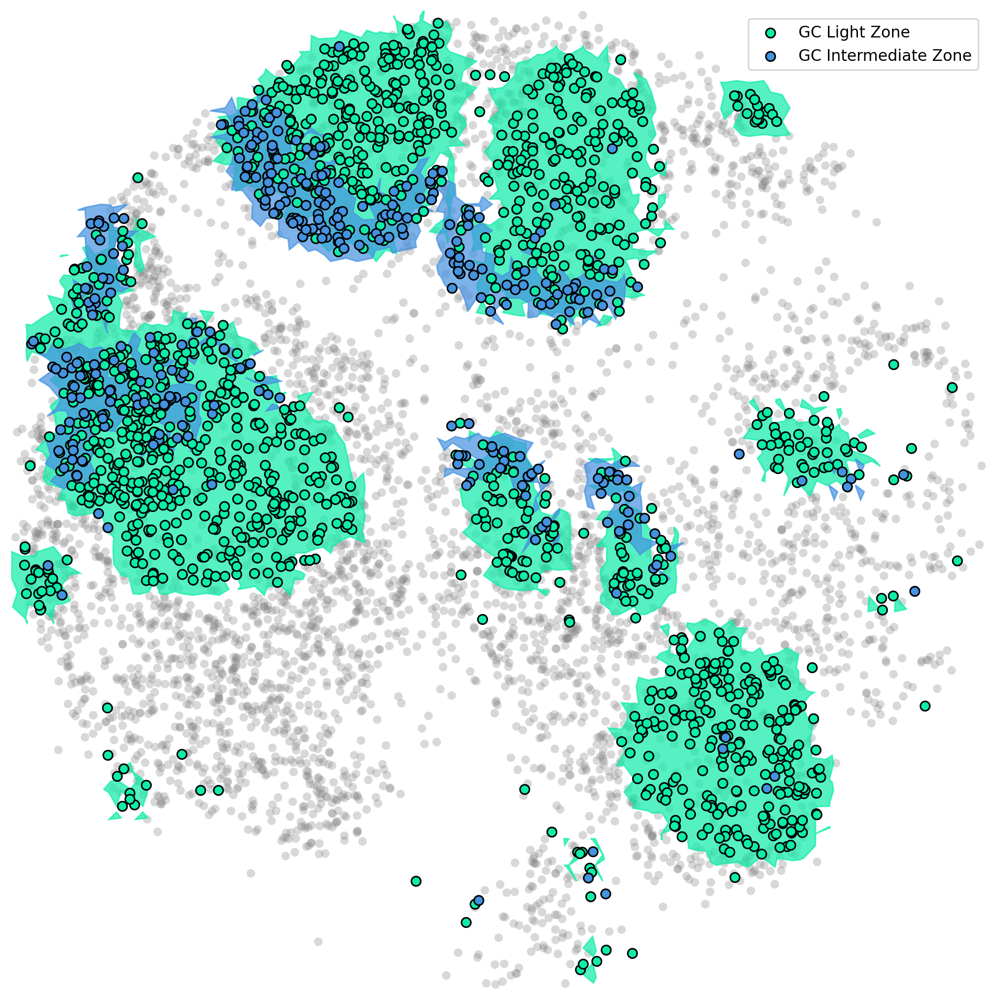

In [52]:
alpha_shapes = {}

for cluster, points in ct_points_ko.items():
    alpha_shapes[cluster] = alphashape.alphashape(points, alpha=0.05)

fig, ax = plt.subplots(figsize=(20, 9), dpi=120)

scatter = sns.scatterplot(
    data = adata.obs,
    x='x', y='y',
    color='grey',
    s=30,
    alpha=0.3,
    edgecolor='none',
    ax=ax,
)

zone_alpha = 0.7
area_thresh = 0

for cluster in ['GC Light Zone', 'GC Intermediate Zone', 'GC Dark Zone']:
    alpha_shape = alpha_shapes.get(cluster)
    
    if alpha_shape is None:
        continue

    if isinstance(alpha_shape, MultiPolygon):
        for geom in alpha_shape.geoms:
            if geom.area > area_thresh:
                ax.fill(
                    geom.exterior.xy[0], 
                    geom.exterior.xy[1], 
                    color=color_dict[str(cluster)], alpha=zone_alpha)
    else:
        geom = alpha_shape
        ax.fill(
            geom.exterior.xy[0], 
            geom.exterior.xy[1], 
            color=color_dict[str(cluster)], alpha=zone_alpha
        )

for ct in chart.adata.obs['transition'].unique():
    ax.scatter(
        chart.adata[chart.adata.obs['transition'] == ct].obsm['spatial'][:, 0],
        chart.adata[chart.adata.obs['transition'] == ct].obsm['spatial'][:, 1],
        c=color_dict[ct], alpha=1, edgecolor='black', linewidth=1,
        label=ct
    )

handles, labels = ax.get_legend_handles_labels()
ax.legend(handles, labels)

ax.set_frame_on(False)
ax.set_xticks([])
ax.set_yticks([])
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_aspect('equal')
ax.set_xlim(adata.obs.x.min() - 10, adata.obs.x.max() + 10)
ax.set_ylim(adata.obs.y.min() - 10, adata.obs.y.max() + 10)
plt.tight_layout()

plt.savefig(f'figures/{goi}KO_postKO_{method}.svg', format='svg', bbox_inches='tight', transparent=True)

In [53]:
df = chart.adata.obs[['banksy_celltypes', 'transition']].copy()
counts = df.groupby(['banksy_celltypes', 'transition']).size().unstack(fill_value=0)

plot_sankey_from_counts(
    df, counts, 
    "SpaceTravLR transitions from FOXO1 KO", 
    f"figures/{goi}KO_transitions_{method}_sankey.svg", 
    color_dict=color_dict
)


# if counts.empty:
#     counts = pd.DataFrame(0, index=counts.index, columns=counts.columns)
# elif len(counts.index) != len(counts.columns):
#     all_labels = sorted(set(counts.index) | set(counts.columns))
#     counts = counts.reindex(index=all_labels, columns=all_labels, fill_value=0)

# plt.figure(figsize=(3,3), dpi=300)

# sns.heatmap(
#     counts,
#     annot=True,
#     fmt='d',  
#     cmap='Blues',
#     linewidths=0.5,
#     linecolor='white',
#     cbar=False,
#     square=True,
#     annot_kws={"size": 6}
# )

# plt.title(f"SpaceTravLR transitions from {goi} KO", fontsize=8)
# plt.xlabel("Transition Label", fontsize=6)
# plt.ylabel("Original", fontsize=6)
# plt.xticks(rotation=45, ha='right', fontsize=6)
# plt.yticks(rotation=0, fontsize=6)

# plt.tight_layout()
# plt.savefig(f'figures/{goi}KO_transitions_{method}.svg', 
#             format='svg', transparent=True, dpi=300, bbox_inches='tight')
# plt.show()

### CO CD4 FOXO1 KO

In [54]:
adata_ = adata[adata.obs['cell_type'].isin(t_cells)]
chart = Cartography(adata_, color_dict)

In [55]:
# CellOracle
simulated_df = oracle.adata.to_df(layer='simulated_count').loc[adata_.obs.index]
method='CO'

In [56]:
co_P = pd.DataFrame(oracle.corrcoef, index=oracle.adata.obs.index, columns=oracle.adata.obs.index)
P = co_P.loc[adata_.obs.index, adata_.obs.index].values

In [57]:
chart.get_transition_annot(
    P, 
    allowed_fates=chart.adata.obs['cell_type'].unique(), 
    thresh=0, 
    annot='cell_type'
)

source ct T_CD4 Counter({'T_CD4': 688, 'T_follicular_helper': 91}) 0.0012501974686865845 0.0
source ct T_follicular_helper Counter({'T_follicular_helper': 288, 'T_CD4': 6}) 0.0009017251385071255 0.0


In [58]:
ct_points_wt, ct_points_ko = chart.make_celltype_dict(annot='cell_type')

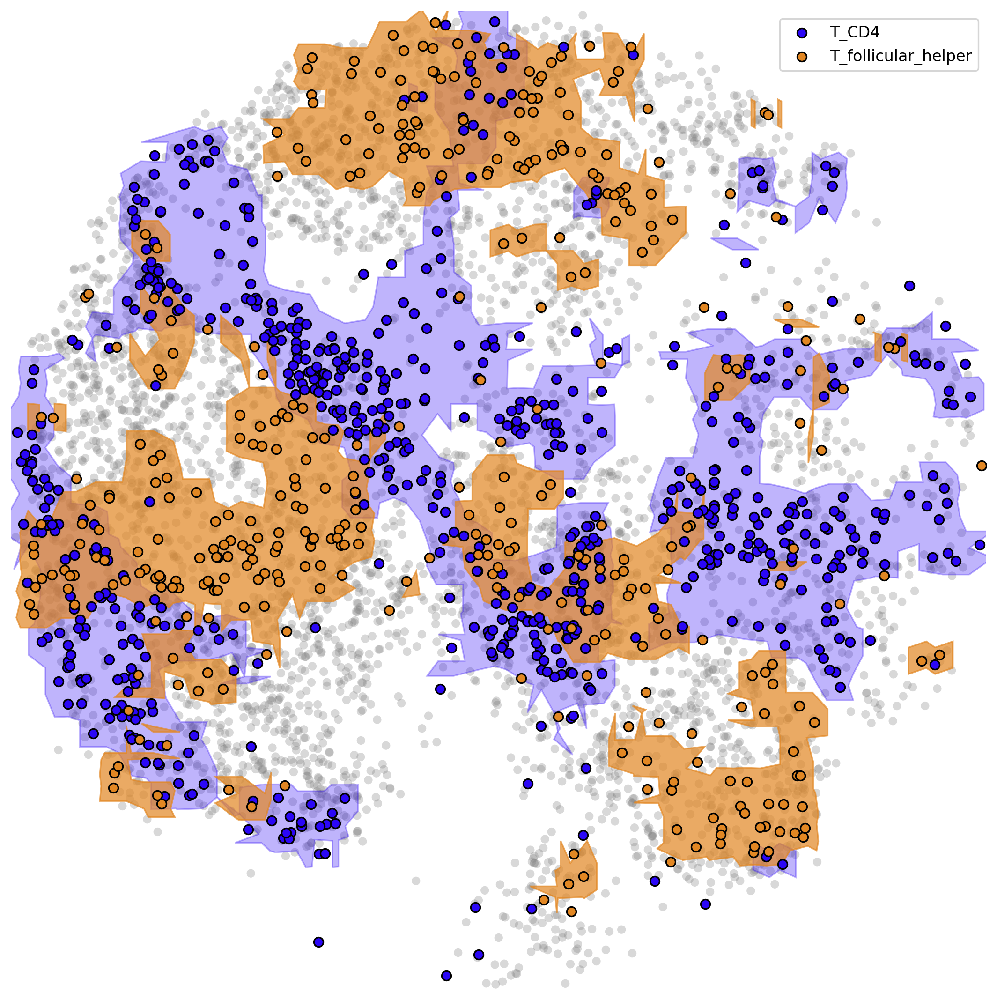

In [59]:
alpha_shapes = {}

for cluster, points in ct_points_ko.items():
    alpha_shapes[cluster] = alphashape.alphashape(points, alpha=0.03)

fig, ax = plt.subplots(figsize=(20, 9), dpi=120)

scatter = sns.scatterplot(
    data = adata.obs,
    x='x', y='y',
    color='grey',
    s=30,
    alpha=0.3,
    edgecolor='none',
    ax=ax,
)

zone_alpha = 0.7
area_thresh = 0

for cluster in adata_.obs['cell_type'].unique():
    alpha_shape = alpha_shapes.get(cluster)
    
    if alpha_shape is None:
        continue

    if cluster == 'T_CD4':
        zone_alpha = 0.3
    else:
        zone_alpha = 0.7

    if isinstance(alpha_shape, MultiPolygon):
        for geom in alpha_shape.geoms:
            if geom.area > area_thresh:
                ax.fill(
                    geom.exterior.xy[0], 
                    geom.exterior.xy[1], 
                    color=color_dict[str(cluster)], alpha=zone_alpha)
    else:
        geom = alpha_shape
        ax.fill(
            geom.exterior.xy[0], 
            geom.exterior.xy[1], 
            color=color_dict[str(cluster)], alpha=zone_alpha
        )

for ct in chart.adata.obs['transition'].unique():
    ax.scatter(
        chart.adata[chart.adata.obs['transition'] == ct].obsm['spatial'][:, 0],
        chart.adata[chart.adata.obs['transition'] == ct].obsm['spatial'][:, 1],
        c=color_dict[ct], alpha=1, edgecolor='black', linewidth=1,
        label=ct
    )

handles, labels = ax.get_legend_handles_labels()
ax.legend(handles, labels)

ax.set_frame_on(False)
ax.set_xticks([])
ax.set_yticks([])
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_aspect('equal')
ax.set_xlim(adata.obs.x.min() - 10, adata.obs.x.max() + 10)
ax.set_ylim(adata.obs.y.min() - 10, adata.obs.y.max() + 10)
plt.tight_layout()

plt.savefig(f'figures/FOXO1_KO_postKO_CO_Cd4.svg', format='svg', bbox_inches='tight', transparent=True)

In [60]:
df = chart.adata.obs[['cell_type', 'transition']].copy()
counts = df.groupby(['cell_type', 'transition']).size().unstack(fill_value=0)

plot_sankey_from_counts(
    df, counts, 
    "CellOracle transitions from FOXO1 KO", 
    "figures/FOXO1_KO_transitions_CO_Cd4_sankey.svg", 
    color_dict=color_dict
)

### Mechanism

In [61]:
simulated_df = pd.read_parquet(f'/ix/djishnu/shared/djishnu_kor11/genome_screens/human_tonsil/FOXO1_4n_0x.parquet')
imputed_df = adata.to_df(layer='imputed_count')

dz_cells = adata.obs[adata.obs.cell_type_2 == 'GC Dark Zone'].index
lz_cells = adata.obs[adata.obs.cell_type_2 == 'GC Light Zone'].index

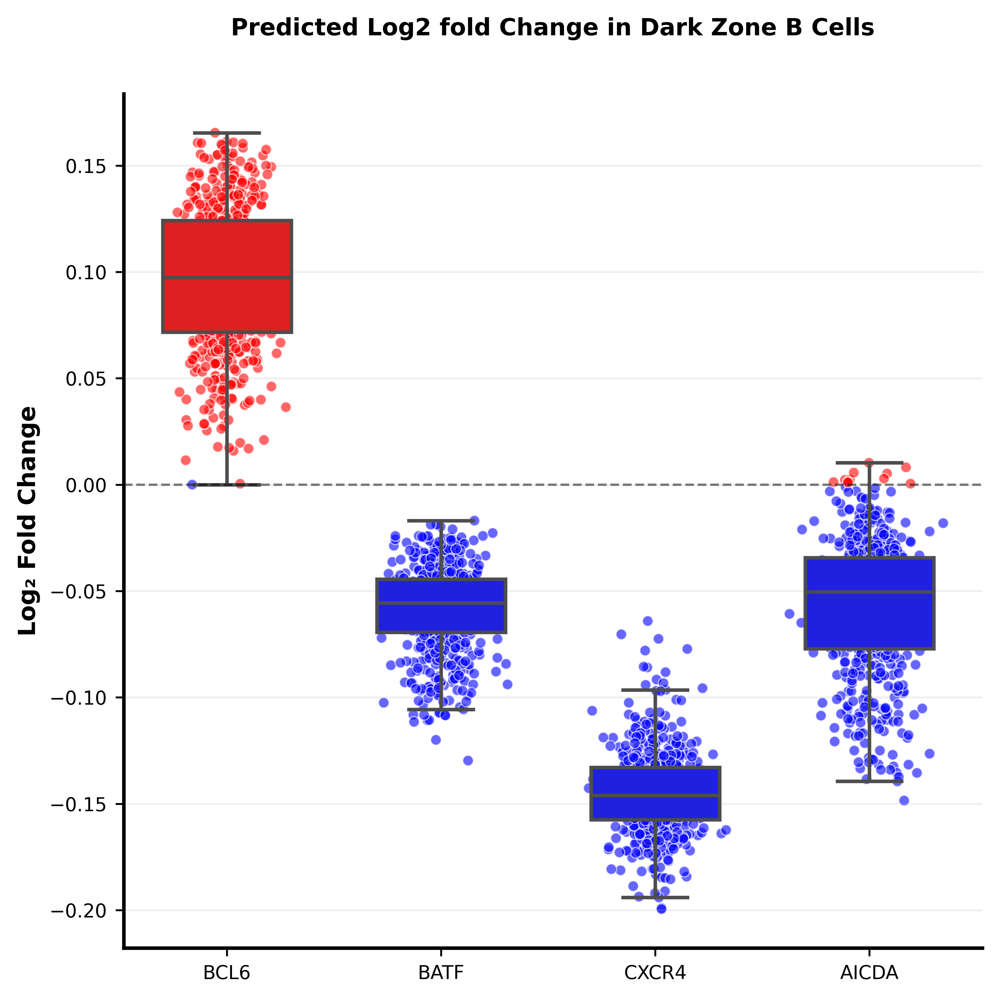

In [62]:
dz_delta = np.log2(simulated_df.loc[dz_cells, :] + 1) - np.log2(imputed_df.loc[dz_cells, :] + 1)

plt.figure(figsize=(6, 6), dpi=300)
genes = ['BCL6', 'BATF', 'CXCR4', 'AICDA']
box_plot = sns.boxplot(data=dz_delta[genes], 
                       palette=['red' if dz_delta[col].mean() > 0 else 'blue' for col in genes],
                       width=0.6,
                       linewidth=1.5,
                       fliersize=0)  # Remove fliers

# Add scatter points with color coding based on sign
for i, gene in enumerate(genes):
    values = dz_delta[gene].dropna()
    colors = ['red' if x > 0 else 'blue' for x in values]
    
    # Add jitter to x-coordinates for better visualization
    x_coords = np.random.normal(i, 0.1, len(values))
    plt.scatter(x_coords, values, c=colors, alpha=0.6, s=20, edgecolors='white', linewidth=0.5)

plt.title('Predicted Log2 fold Change in Dark Zone B Cells', 
          fontsize=10, fontweight='bold', pad=25)
plt.ylabel('Log₂ Fold Change', fontsize=10, fontweight='bold')
plt.xlabel('', fontsize=10, fontweight='bold')
plt.xticks(fontsize=8)
plt.yticks(fontsize=8)

# Add grid for better readability
plt.grid(axis='y', alpha=0.2, linestyle='-')

# Customize the plot style
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['left'].set_linewidth(1.5)
plt.gca().spines['bottom'].set_linewidth(1.5)

# Add horizontal line at y=0 for reference
plt.axhline(y=0, color='black', linestyle='--', alpha=0.5, linewidth=1)

plt.tight_layout()
plt.savefig(f'figures/FOXO1KO_expression_changes_GCDZBcells.svg', format='svg', bbox_inches='tight', transparent=True)
plt.show()

### human lymph visium

In [63]:
# original notebook: /ix3/djishnu/alw399/SpaceOracle/notebooks/human_lymphnode_visium/02_cross_predict.ipynb

In [64]:
import scanpy as sc
tonsil = sc.read_h5ad('/ix/djishnu/shared/djishnu_kor11/training_data_2025/snrna_human_tonsil.h5ad')
adata_vis = sc.read_h5ad('/ix/djishnu/shared/djishnu_kor11/training_data_2025/human_lymph_visium.h5ad')
adata_vis.layers['normalized_count'] = adata_vis.layers['normalized_count'].toarray()

In [65]:
adata_c2l = sc.read_h5ad('/ix3/djishnu/alw399/SpaceOracle/notebooks/human_lymphnode_visium/cell2location/cell2location_map/sp.h5ad')
adata_c2l

AnnData object with n_obs × n_vars = 4035 × 10217
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', '_indices', '_scvi_batch', '_scvi_labels', 'total RNA counts', 'Total cell abundance (sum_f w_sf)', 'RNA detection sensitivity (y_s)', 'B_Cycling', 'B_GC_DZ', 'B_GC_LZ', 'B_GC_prePB', 'B_IFN', 'B_activated', 'B_mem', 'B_naive', 'B_plasma', 'B_preGC', 'DC_CCR7+', 'DC_cDC1', 'DC_cDC2', 'DC_pDC', 'Endo', 'FDC', 'ILC', 'Macrophages_M1', 'Macrophages_M2', 'Mast', 'Monocytes', 'NK', 'NKT', 'T_CD4+', 'T_CD4+_TfH', 'T_CD4+_TfH_GC', 'T_CD4+_naive', 'T_CD8+_CD161+', 'T_CD8+_cytotoxic', 'T_CD8+_naive', 'T_TIM3+', 'T_TfR', 'T_Treg', 'VSMC', 'leiden', 'region_cluster', 'mean_nUMI_factorsfact_0', 'mean_nUMI_factorsfact_1', 'mean_nUMI_factorsfact_2', 'mean_nUMI_factorsfact_3', 'mean_nUMI_factorsfact_4', 'mean_nUMI_factorsfact_5', 'mean_nUMI_factorsfact_6', 'mean_nUMI_factorsfact_7', 'mean_nUMI_factorsfact_8', 'mean_nUMI_factorsfact_9', 'mean_nUMI_factorsfact_10', 'mean_nUMI_factorsfact_11'
    

In [66]:
groupings = {
    'GC B': ['B_Cycling', 'B_GC_DZ', 'B_GC_LZ', 'B_GC_prePB', 'B_IFN', 'B_activated'],
    'B memory': ['B_mem'],
    'B naive': ['B_naive', 'B_preGC'],
    'T cells': ['T_CD8+_CD161+', 'T_CD8+_cytotoxic', 'T_CD8+_naive', 'T_TIM3+'],
    'CD4+ T': ['T_CD4+', 'T_CD4+_naive', 'T_TfR', 'T_Treg'],
    'DC': ['DC_CCR7+', 'DC_cDC1', 'DC_cDC2', 'DC_pDC', 'FDC'],
    'Plasma': ['B_plasma'],
    'Tfh': ['T_CD4+_TfH', 'T_CD4+_TfH_GC'],
    'Macrophages': ['Macrophages_M1', 'Macrophages_M2'],
    'unmapped': ['Endo', 'ILC', 'Mast', 'Monocytes', 'NK', 'NKT', 'VSMC']
}

P = adata_c2l.obs[['B_Cycling', 'B_GC_DZ', 'B_GC_LZ', 'B_GC_prePB', 'B_IFN', 'B_activated', 'B_mem', 'B_naive', 
                  'B_plasma', 'B_preGC', 'DC_CCR7+', 'DC_cDC1', 'DC_cDC2', 'DC_pDC', 'Endo', 'FDC', 'ILC', 
                  'Macrophages_M1', 'Macrophages_M2', 'Mast', 'Monocytes', 'NK', 'NKT', 'T_CD4+', 'T_CD4+_TfH', 
                  'T_CD4+_TfH_GC', 'T_CD4+_naive', 'T_CD8+_CD161+', 'T_CD8+_cytotoxic', 'T_CD8+_naive', 'T_TIM3+', 
                  'T_TfR', 'T_Treg', 'VSMC']]
P_grouped = pd.DataFrame(index=P.index)

for group, celltypes in groupings.items():
    P_grouped[group] = P[celltypes].sum(axis=1)

P_grouped.idxmax(axis=1).value_counts()

B naive        1432
CD4+ T         1111
GC B            990
unmapped        301
B memory        116
T cells          34
DC               24
Plasma           24
Macrophages       3
Name: count, dtype: int64

In [67]:
# Filter out spots with majority cell types that tonsil did not have
adata_vis = adata_vis[P_grouped[P_grouped.idxmax(axis=1) != 'unmapped'].index, :]
adata_vis

View of AnnData object with n_obs × n_vars = 3734 × 3333
    obs: 'leiden', 'region_cluster'
    uns: 'log1p', 'spatial'
    obsm: 'X_umap', 'spatial', 'spatial_unscaled'
    layers: 'normalized_count', 'raw_count'

In [68]:
import sys 
sys.path.append('../../src')
from spaceoracle.plotting.cartography import Cartography
from spaceoracle.plotting.shift import estimate_transition_probabilities, project_probabilities

In [69]:
c2l_features = adata_c2l.obs[['B_Cycling', 'B_GC_DZ', 'B_GC_LZ', 'B_GC_prePB', 'B_IFN', 'B_activated',
       'B_mem', 'B_naive', 'B_plasma', 'B_preGC', 'DC_CCR7+', 'DC_cDC1',
       'DC_cDC2', 'DC_pDC', 'Endo', 'FDC', 'ILC', 'Macrophages_M1',
       'Macrophages_M2', 'Mast', 'Monocytes', 'NK', 'NKT', 'T_CD4+',
       'T_CD4+_TfH', 'T_CD4+_TfH_GC', 'T_CD4+_naive', 'T_CD8+_CD161+',
       'T_CD8+_cytotoxic', 'T_CD8+_naive', 'T_TIM3+', 'T_TfR', 'T_Treg',
       'VSMC']]

c2l_adata = sc.AnnData(
    X = c2l_features.values,
    obs = pd.DataFrame(adata_c2l.obs['leiden'], index=c2l_features.index),
    var = pd.DataFrame(index=c2l_features.columns)
)
c2l_adata

AnnData object with n_obs × n_vars = 4035 × 34
    obs: 'leiden'

In [70]:
adata = adata_vis

In [71]:
layout_embedding = adata.obsm['X_umap']
remove_null=True
normalize=False
n_neighbors=200

In [72]:
adata.obs['leiden'] = adata_c2l.obs['leiden']

In [73]:
adata.layers['imputed_count'] = adata.layers['normalized_count']
adata.obs['leiden'] = adata.obs['leiden'].astype('category')

In [74]:
gc_labels = [
    'B_GC_DZ', 'B_GC_LZ'
    # 'B_Cycling', 'B_activated','B_GC_prePB'
] 

In [75]:
adata.obs = adata.obs.join(adata_c2l.obs[['B_GC_DZ', 'B_GC_LZ']])

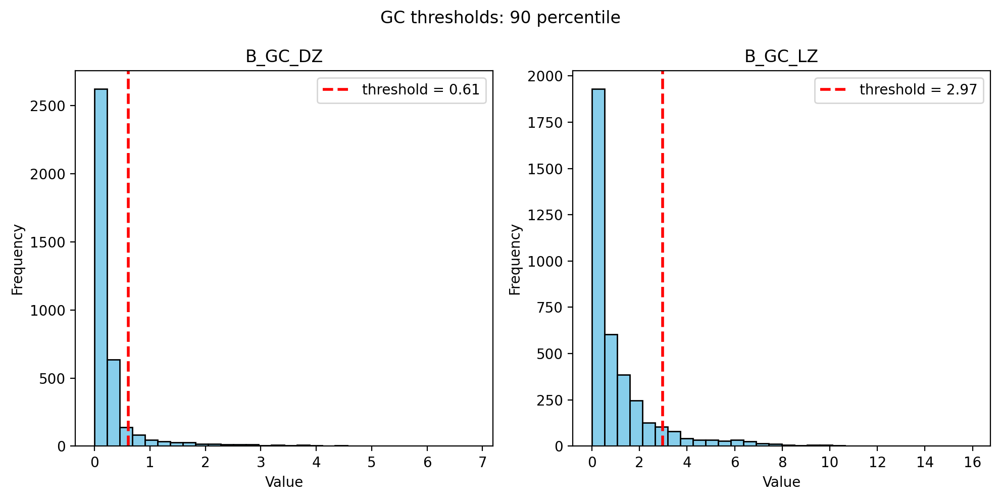

In [76]:
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes = axes.flatten()

percentile = 90

for i, label in enumerate(gc_labels):
    ax = axes[i]
    data = adata.obs[label].dropna()

    # Plot histogram
    ax.hist(data, bins=30, color='skyblue', edgecolor='black')

    # Plot red dashed line at mean
    mean_val = np.percentile(data, percentile)
    ax.axvline(mean_val, color='red', linestyle='--', linewidth=2, label=f'threshold = {mean_val:.2f}')

    ax.set_title(f'{label}')
    ax.set_xlabel('Value')
    ax.set_ylabel('Frequency')
    ax.legend()

# Turn off unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.suptitle(f'GC thresholds: {percentile} percentile')
plt.tight_layout()
plt.show()

In [77]:
thresholds = adata.obs[gc_labels].apply(lambda col: np.percentile(col.dropna(), percentile))
condition = adata.obs[gc_labels] > thresholds

mask = condition.any(axis=1)

adata_ = adata[mask].copy()
adata_

AnnData object with n_obs × n_vars = 558 × 3333
    obs: 'leiden', 'region_cluster', 'B_GC_DZ', 'B_GC_LZ'
    uns: 'log1p', 'spatial'
    obsm: 'X_umap', 'spatial', 'spatial_unscaled'
    layers: 'normalized_count', 'raw_count', 'imputed_count'

In [78]:
sc.pp.neighbors(adata_, use_rep='X_umap')
sc.tl.leiden(adata_, resolution=0.03, key_added='cell_type')

adata_.obs['cell_type'] = adata_.obs['cell_type'].astype(int)
adata_.obs['cell_type'].value_counts()

cell_type
0    250
1    141
2     97
3     70
Name: count, dtype: int64

In [79]:
# Reorder so that DZ/LZ ratio is in decreasing order
mapping = {
    0: 2,
    1: 3,
    2: 0,
    3: 1,
}
adata_.obs['cell_type'] = adata_.obs['cell_type'].map(mapping)
adata_.obs['cell_type'].value_counts()

cell_type
2    250
3    141
0     97
1     70
Name: count, dtype: int64

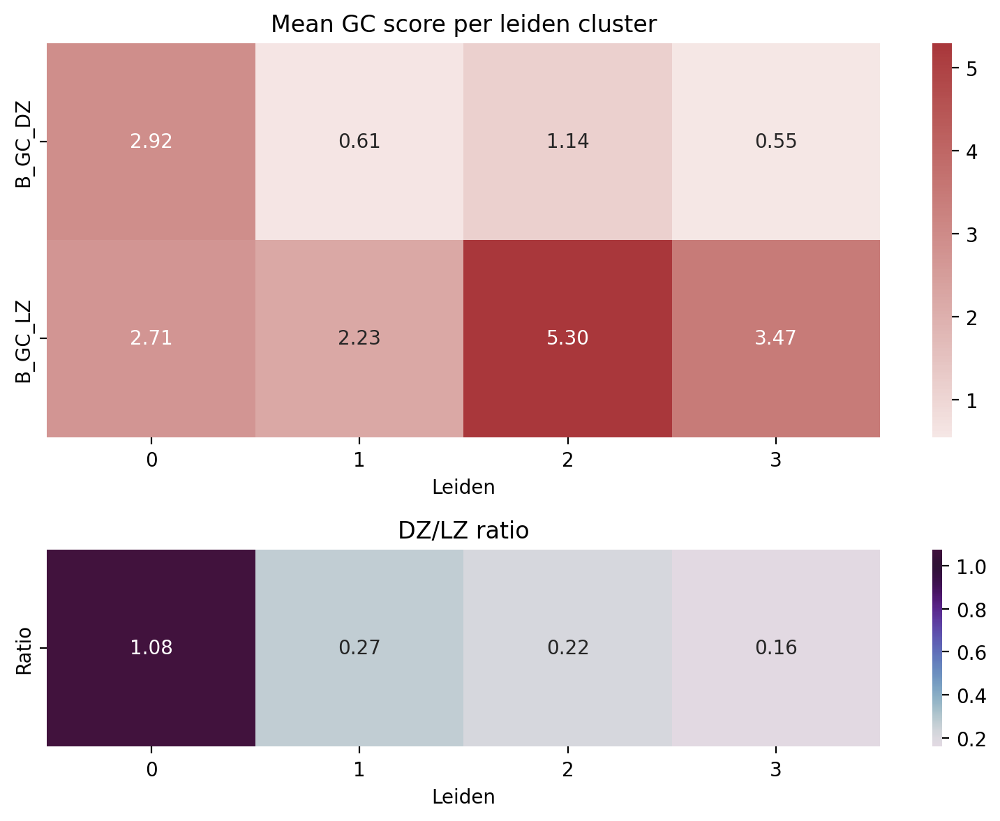

In [80]:
heatmap_data = adata_.obs[gc_labels].groupby(adata_.obs['cell_type']).mean().T

# Calculate ratios directly
ratios = pd.DataFrame(heatmap_data.iloc[0] / heatmap_data.iloc[1]).T
ratios.index = ['Ratio']

heatmap_data = heatmap_data[sorted(adata_.obs['cell_type'].unique())]
ratios = ratios[sorted(adata_.obs['cell_type'].unique())]

# Create figure with two subplots stacked vertically
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(8, 6), height_ratios=[2, 1])

# Plot mean scores
sns.heatmap(
    heatmap_data,
    cmap='vlag',
    center=0,
    annot=True,
    fmt=".2f",
    ax=ax1, 
)
ax1.set_title('Mean GC score per leiden cluster')
ax1.set_xlabel('Leiden')

# Plot ratios
sns.heatmap(
    ratios,
    cmap='twilight',
    center=1,
    annot=True,
    fmt=".2f",
    ax=ax2,
)
ax2.set_title('DZ/LZ ratio')
ax2.set_xlabel('Leiden')

plt.tight_layout()
plt.savefig("figures/human_lymph_visium_gc_expression_heatmap.svg", format="svg")
plt.show()

In [81]:
color_dict = {
    0: "#301336",
    1: "#6c8fbf",
    2: '#a8d3e0',
    3: "#dcbeeb",
}

chart.color_dict = color_dict

In [82]:
adata_.obs['leiden'] = adata_.obs['cell_type']
adata_.layers['imputed_count'] = adata_.layers['normalized_count'].astype(float)

In [83]:
chart = Cartography(adata_, color_dict=color_dict)

In [84]:
target_gene = 'FOXO1'
perturbed_df = pd.read_parquet(f'/ix/djishnu/shared/djishnu_kor11/genome_screens/human_lymph_visium/{target_gene}_4n_0x.parquet')
perturbed_df = perturbed_df.loc[chart.adata.obs.index, chart.adata.var.index]
delta_X = perturbed_df.values - chart.adata.layers['normalized_count']

In [85]:
corr = chart.compute_perturbation_corr(
    chart.adata.layers['normalized_count'].astype(float), 
    delta_X.astype(float)
)
corr.shape

(558, 558)

In [86]:
clusters = adata_.obs['leiden'].unique()

In [87]:
delta_X.shape

(558, 3333)

In [88]:
chart.get_transition_annot(
    corr, 
    allowed_fates=clusters, 
    thresh=0,
    annot='leiden')

source ct 3 Counter({3: 98, 1: 28, 0: 11, 2: 4}) 0.0020341968464080433 0.0006559222670255318
source ct 0 Counter({3: 57, 2: 28, 1: 12}) 0.002058320170272197 0.0005834632745385334
source ct 2 Counter({3: 141, 2: 66, 1: 24, 0: 19}) 0.002064475332967054 0.0006349335553560221
source ct 1 Counter({3: 40, 1: 18, 2: 9, 0: 3}) 0.0018406114585515217 0.0009143647563188018


In [89]:
xy = pd.DataFrame(adata.obsm['spatial'], index=adata.obs.index, columns=['x', 'y'])


In [90]:
ct_points_wt, ct_points_ko = chart.make_celltype_dict(annot='leiden', basis='X_umap')

alpha_shape_wt = {}
alpha_shape_ko = {}

for c in adata_.obs['leiden'].unique():
    alpha_shape_wt[c] = alphashape.alphashape(ct_points_wt[c], alpha=2.4)

    if c in ct_points_ko:
        alpha_shape_ko[c] = alphashape.alphashape(ct_points_ko[c], alpha=2.4)

In [91]:
adata_full = adata_vis
adata_full.obs['x'] = adata_full.obsm['spatial'][:, 0]
adata_full.obs['y'] = adata_full.obsm['spatial'][:, 1]

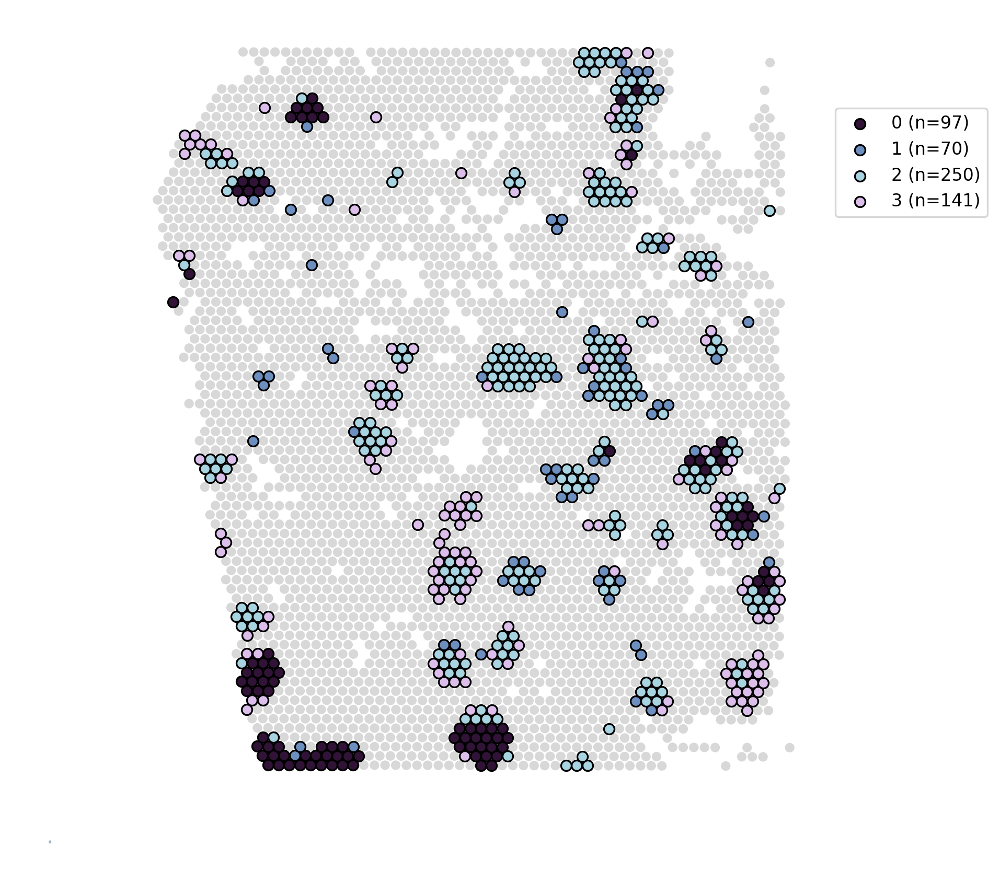

In [92]:
fig, ax = plt.subplots(figsize=(20, 9), dpi=120)

scatter = sns.scatterplot(
    data=adata_full.obs,
    x='x', y='y',
    # hue='banksy_celltypes', 
    color='grey',
    s=30,
    alpha=0.3,
    edgecolor='none',
    # palette=color_dict,
    ax=ax,
)

zone_alpha = 0.7
area_thresh = 400

for c in adata_.obs['leiden'].unique():
    try:
        for geom in alpha_shape_wt[c].geoms:
            if geom.area > area_thresh:
                ax.fill(
                    geom.exterior.xy[0], 
                    geom.exterior.xy[1], 
                    color=color_dict[c], alpha=zone_alpha
                )
    except:
        geom = alpha_shape_wt[c]
        ax.fill(
            geom.exterior.xy[0], 
            geom.exterior.xy[1], 
            color=color_dict[c], alpha=zone_alpha
        )

for ct in sorted(adata_.obs['leiden'].unique()):
    ncells = sum(adata_.obs['leiden'] == ct)
    ax.scatter(
        adata_[adata_.obs['leiden'] == ct].obsm['spatial'][:, 0],
        adata_[adata_.obs['leiden'] == ct].obsm['spatial'][:, 1],
        c=color_dict[ct], alpha=1, edgecolor='black', linewidth=1, 
        label=f'{ct} (n={ncells})'
    )

handles, labels = ax.get_legend_handles_labels()
sorted_handles_labels = sorted(zip(handles, labels), key=lambda x: x[1])
sorted_handles, sorted_labels = zip(*sorted_handles_labels)
ax.legend(sorted_handles, sorted_labels, bbox_to_anchor=(1, 0.9))

ax.set_frame_on(False)
ax.set_xticks([])
ax.set_yticks([])
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_aspect('equal')

plt.savefig(f'figures/human_lymph_visium_{target_gene}KO_preKO.svg', format='svg')

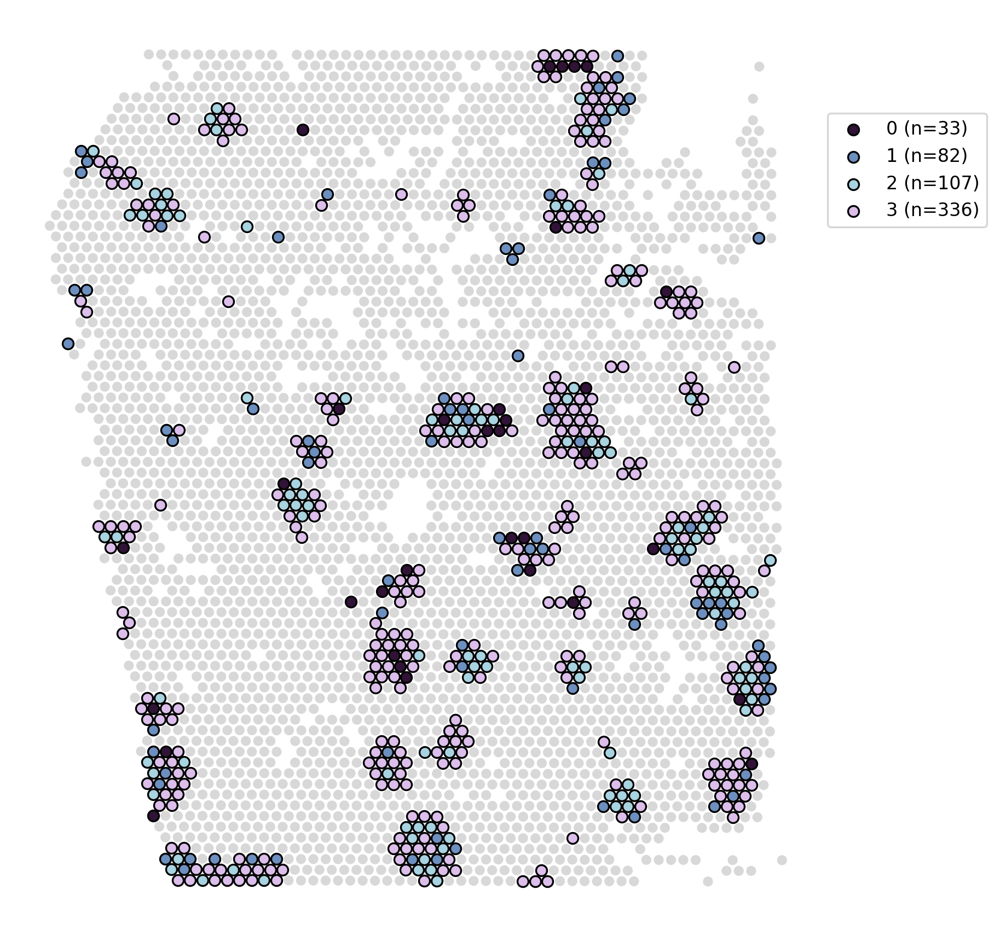

In [93]:
fig, ax = plt.subplots(figsize=(20, 9), dpi=120)

scatter = sns.scatterplot(
    data=adata_full.obs,
    x='x', y='y',
    color='grey',
    s=30,
    alpha=0.3,
    edgecolor='none',
    ax=ax,
)

zone_alpha = 0.7
area_thresh = 400

for c in alpha_shape_ko.keys():
    try:
        for geom in alpha_shape_ko[c].geoms:
            if geom.area > area_thresh:
                ax.fill(
                    geom.exterior.xy[0], 
                    geom.exterior.xy[1], 
                    color=color_dict[c], alpha=zone_alpha
                )
    except:
        geom = alpha_shape_ko[c]
        ax.fill(
            geom.exterior.xy[0], 
            geom.exterior.xy[1], 
            color=color_dict[c], alpha=zone_alpha
        )

for ct in adata_.obs['transition'].unique():
    ncells = sum(adata_.obs['transition'] == ct)
    ax.scatter(
        adata_[adata_.obs['transition'] == ct].obsm['spatial'][:, 0],
        adata_[adata_.obs['transition'] == ct].obsm['spatial'][:, 1],
        c=color_dict[ct], alpha=1, edgecolor='black', linewidth=1, 
        label=f'{ct} (n={ncells})'
    )

handles, labels = ax.get_legend_handles_labels()
sorted_handles_labels = sorted(zip(handles, labels), key=lambda x: x[1])
sorted_handles, sorted_labels = zip(*sorted_handles_labels)
ax.legend(sorted_handles, sorted_labels, bbox_to_anchor=(1, 0.9))

ax.set_frame_on(False)
ax.set_xticks([])
ax.set_yticks([])
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_aspect('equal')

plt.savefig(f'figures/human_lymph_visium_{target_gene}KO_postKO.svg', format='svg')

In [94]:
df = adata_.obs[['leiden', 'transition']].copy()
df['leiden'] = pd.Categorical(df['leiden'], ordered=True, categories=sorted(df['leiden'].unique(), key=lambda x: int(x)))
counts = df.groupby(['leiden', 'transition']).size().unstack(fill_value=0)

plot_sankey_from_counts(
    df, counts, 
    "SpaceTravLR transitions from FOXO1 KO", 
    f"figures/human_lymph_visium_FOXO1KO_sankey.svg", 
    color_dict=color_dict
)

In [95]:
# plt.figure(figsize=(3,3), dpi=300)

# sns.heatmap(
#     counts,
#     annot=True,
#     fmt='d',  # integer formatting
#     cmap='Blues',  # nice clean color palette
#     linewidths=0.5,
#     linecolor='white',
#     cbar=False,
#     square=True,
#     annot_kws={"size": 6}
# )

# plt.title("Transitions between Leiden Clusters from FOXO1 KO", fontsize=8)
# plt.xlabel("Transition Label", fontsize=6)
# plt.ylabel("Original", fontsize=6)
# plt.xticks(rotation=0, ha='right', fontsize=6)
# plt.yticks(rotation=0, fontsize=6)

# plt.savefig('figures/human_lymph_visium_FOXO1KO_transitions.svg', format='svg')
# plt.tight_layout()
# plt.show()
